In [1]:
import pymn
import pandas as pd
import matplotlib.pyplot as plt
import scanpy as sc
import anndata as ad
import numpy as np
import itertools
import scipy.stats
import seaborn as sns
import scgen 
sc.settings.verbosity = 3   
sc.set_figure_params(figsize = (15,15),facecolor = 'white')

Global seed set to 0
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [ ]:
norm_data = sc.read_h5ad('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/unintegrated_data_fast.h5ad')


In [ ]:
norm_data

In [ ]:
norm_data.var['ZM'] = norm_data.var_names.str.startswith('Zm')
norm_data = norm_data[:, norm_data.var['ZM'] == True] 
norm_data.var#

In [ ]:
norm_data.obs

In [ ]:
cell_identity = pd.read_csv('/data/passala/Collaborator_Data/Bruno_Ken_Collab/Post_review_Dataset/Meta_Maize_Sorghum_Setaria_Nuclei_Cells_SCT_OrthologousgenesGoodname_Sept2022.csv',index_col = 0)
cell_identity

In [ ]:
norm_data.obs['Cell Cluster Annotation'] = cell_identity['Annotation']
norm_data.obs['Batch'] = cell_identity['orig.ident']
norm_data.obs['Species'] = cell_identity['Species']


In [ ]:
norm_data.obs['Cluster and Type'] = norm_data.obs['Cell Cluster Annotation']
norm_data.obs['Cluster and Type'].loc[norm_data.obs_names.str.contains('Nucl')] = norm_data.obs['Cluster and Type'] + ' Nucl'
norm_data.obs['Cluster and Type'].loc[norm_data.obs_names.str.contains('Cell')] = norm_data.obs['Cluster and Type'] + ' Cell'
norm_data.obs['Cluster and Species'] = norm_data.obs['Cell Cluster Annotation']
norm_data.obs['Cluster and Species'].loc[norm_data.obs['Species'].str.contains('Maize')] = norm_data.obs['Cluster and Type'] + ' Maize'
norm_data.obs['Cluster and Species'].loc[norm_data.obs['Species'].str.contains('Millet')] = norm_data.obs['Cluster and Type'] + ' Millet'
norm_data.obs['Cluster and Species'].loc[norm_data.obs['Species'].str.contains('Sorghum')] = norm_data.obs['Cluster and Type'] + ' Sorghum'
norm_data.obs['Type'] = np.nan
norm_data.obs['Type'].loc[norm_data.obs_names.str.contains('Nucl')] = 'Nucl'
norm_data.obs['Type'].loc[norm_data.obs_names.str.contains('Cell')] = 'Cell'
norm_data.obs['Type and Species'] = norm_data.obs['Species'] + ' '+  norm_data.obs['Type']
norm_data.obs

In [ ]:
sc.pp.calculate_qc_metrics(norm_data, percent_top=None, log1p=False, inplace=True)


In [ ]:
batch_list = list(norm_data.obs['Batch'].unique())

In [ ]:
sc.pp.log1p(norm_data)

In [ ]:
sc.pp.highly_variable_genes(norm_data, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key = 'Batch')

In [ ]:
# sc.pp.regress_out(norm_data, ['total_counts'])


In [ ]:
sc.pp.scale(norm_data, max_value=10)


In [ ]:
highly_variable_genes_across_batches  = norm_data.var['highly_variable_nbatches']>2
norm_data.var['highly_variable'].loc[highly_variable_genes_across_batches] = True


In [ ]:
high_var_list = norm_data.var.loc[highly_variable_genes_across_batches].index.to_list()


In [ ]:
norm_data.var['highly_variable_nbatches'].value_counts()

In [ ]:
sc.pl.highly_variable_genes(norm_data)

In [ ]:
sc.pl.highly_variable_genes(norm_data, show = True)

In [ ]:
sc.tl.pca(norm_data, svd_solver='arpack')
sc.pp.neighbors(norm_data, n_neighbors=10, n_pcs=40)
sc.tl.umap(norm_data)


In [ ]:
sc.tl.leiden(norm_data)


In [7]:
sc.set_figure_params(figsize = (15,15),facecolor = 'white')


In [ ]:
sc.pl.umap(norm_data, color=['Cell Cluster Annotation'], s = 12)

In [ ]:
sc.pl.umap(norm_data, color=['leiden'], s = 4)


In [ ]:
sc.pl.umap(norm_data, color=['Batch'], s = 12)

In [ ]:
sc.pl.umap(norm_data, color=['Species'], s = 12)

In [ ]:
norm_data.obs['Type'].unique()

In [ ]:
norm_data

In [ ]:
cells_only_data = norm_data[norm_data.obs['Type'] == 'Cell',:]
nuclei_only_data = norm_data[norm_data.obs['Type'] == 'Nucl',:]

cells_only_data

In [ ]:
nuclei_only_data

In [ ]:
cells_only_data = cells_only_data.copy()
nuclei_only_data = nuclei_only_data.copy()

In [ ]:
#cells_only_data.write('/data/passala/Generated_Tables/Temp_junk/precorrect_Cell_only_norm_data_from_bruno.h5ad')
cells_only_data = sc.read_h5ad('/data/passala/Generated_Tables/Temp_junk/precorrect_Cell_only_norm_data_from_bruno.h5ad')

In [2]:
#nuclei_only_data.write('/data/passala/Generated_Tables/Temp_junk/precorrect_nucl_only_norm_data_from_bruno.h5ad')
nuclei_only_data = sc.read_h5ad('/data/passala/Generated_Tables/Temp_junk/precorrect_nucl_only_norm_data_from_bruno.h5ad')

In [ ]:
import scgen
scgen.SCGEN.setup_anndata(cells_only_data, batch_key="Batch", labels_key="Cell Cluster Annotation")

model = scgen.SCGEN(cells_only_data)
model.train(
    max_epochs=150,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=25,
)

In [ ]:
corrected_adata = model.batch_removal()
corrected_adata

In [ ]:
#corrected_adata.write('/data/passala/Generated_Tables/Temp_junk/corrected_Cell_only_norm_data_from_bruno.h5ad')

In [2]:
corrected_adata = sc.read_h5ad('/data/passala/Generated_Tables/Temp_junk/corrected_Cell_only_norm_data_from_bruno.h5ad')

In [11]:
sc.pp.neighbors(corrected_adata)
sc.tl.umap(corrected_adata)


computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


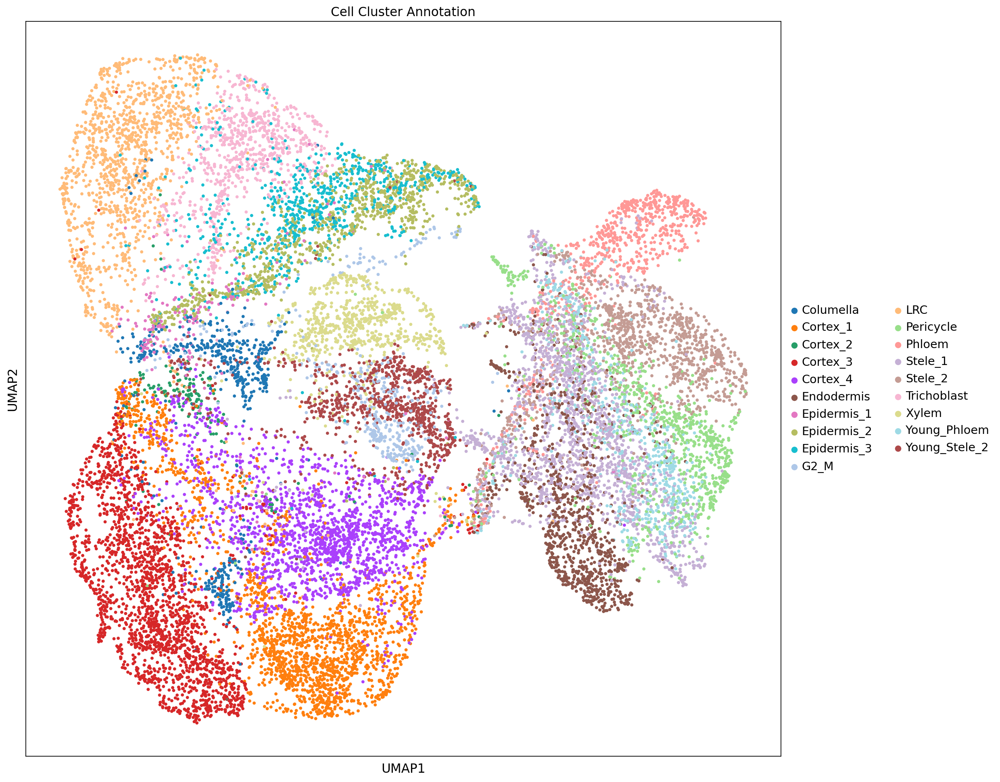

In [8]:
sc.pl.umap(corrected_adata, color=['Cell Cluster Annotation'], s = 50)

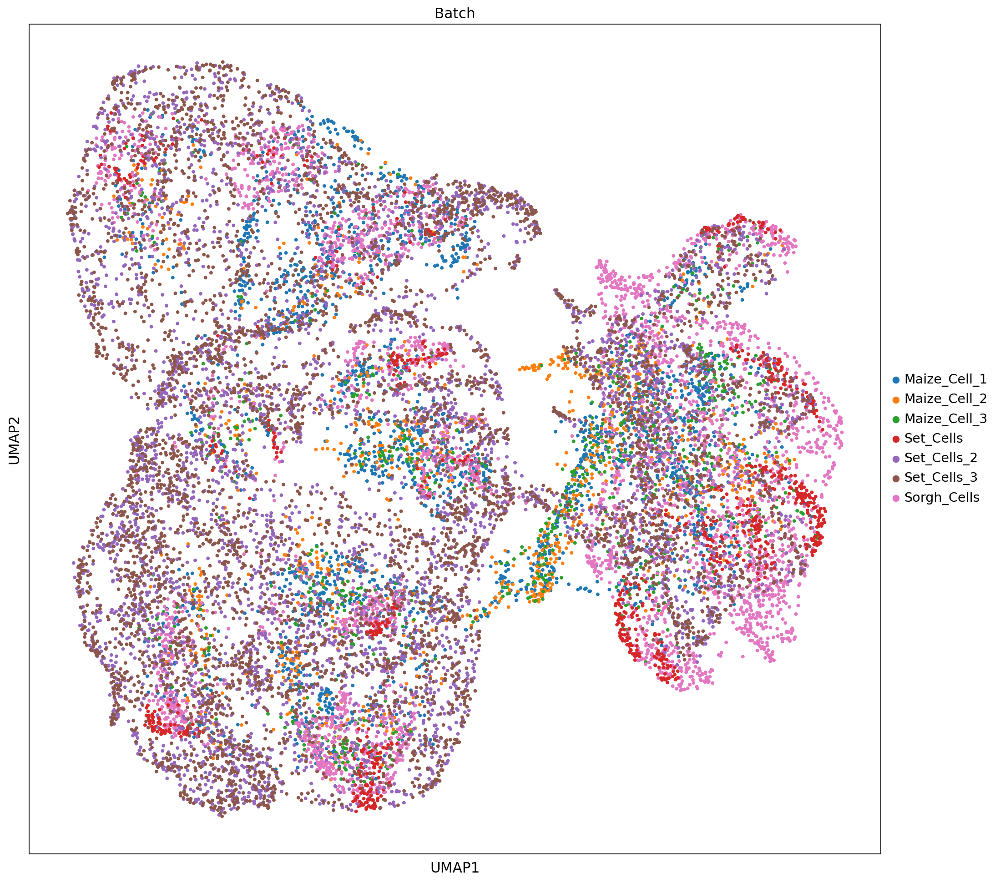

In [9]:
sc.pl.umap(corrected_adata, color=['Batch'], s = 50)

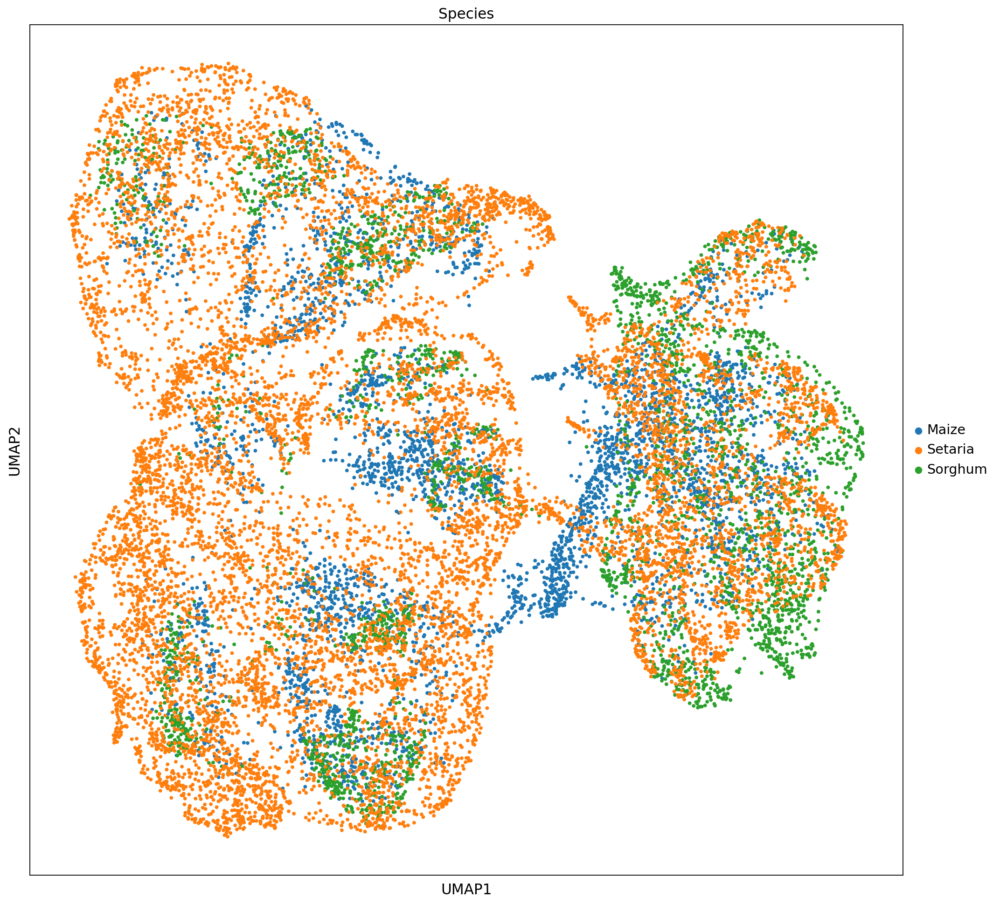

In [10]:
sc.pl.umap(corrected_adata, color=['Species'], s = 50)

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/seaborn/matrix.py:1214: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


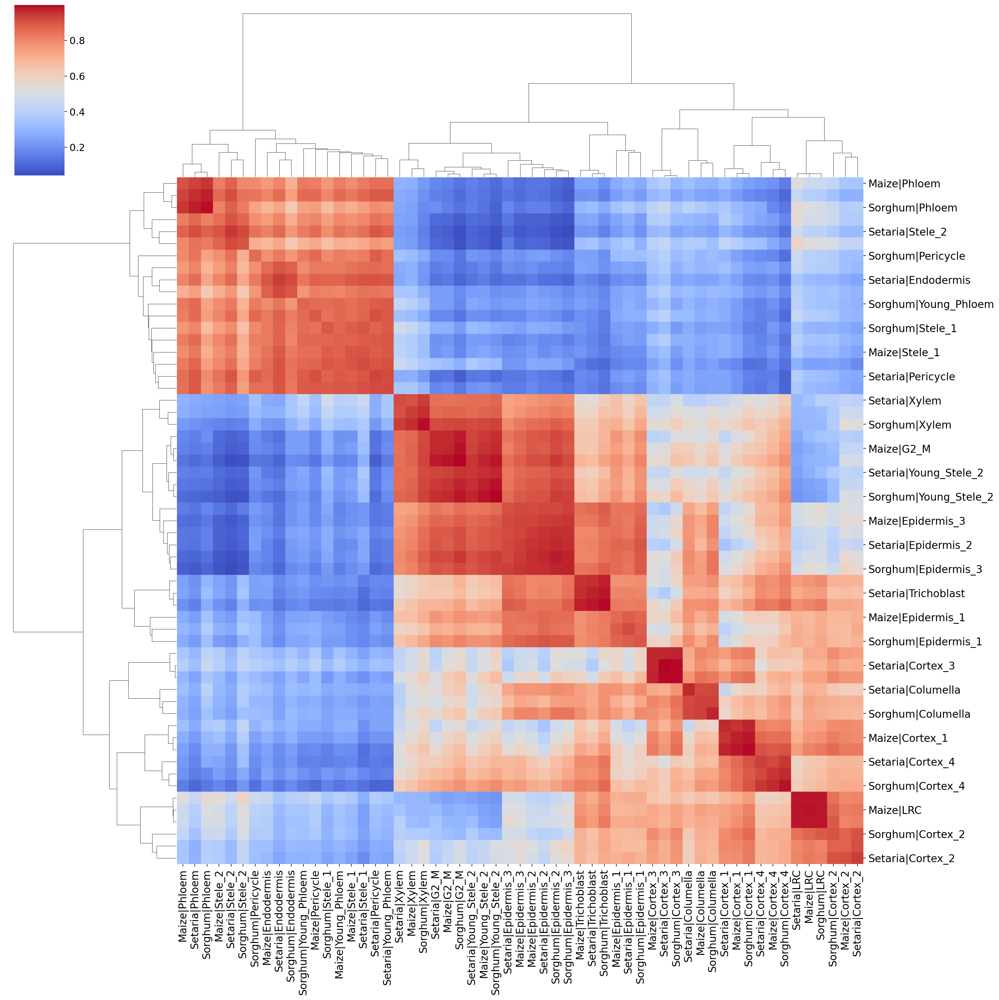

In [12]:
pymn.variableGenes(corrected_adata,study_col = 'Species')
pymn.MetaNeighborUS(corrected_adata,study_col = 'Species',ct_col = 'Cell Cluster Annotation', compute_p= True)
g = pymn.plotMetaNeighborUS(corrected_adata,figsize = (2,20),fontsize = 15,show = False,cbar_pos = (0.02,0.82,0.05,0.17), cmap = 'coolwarm')

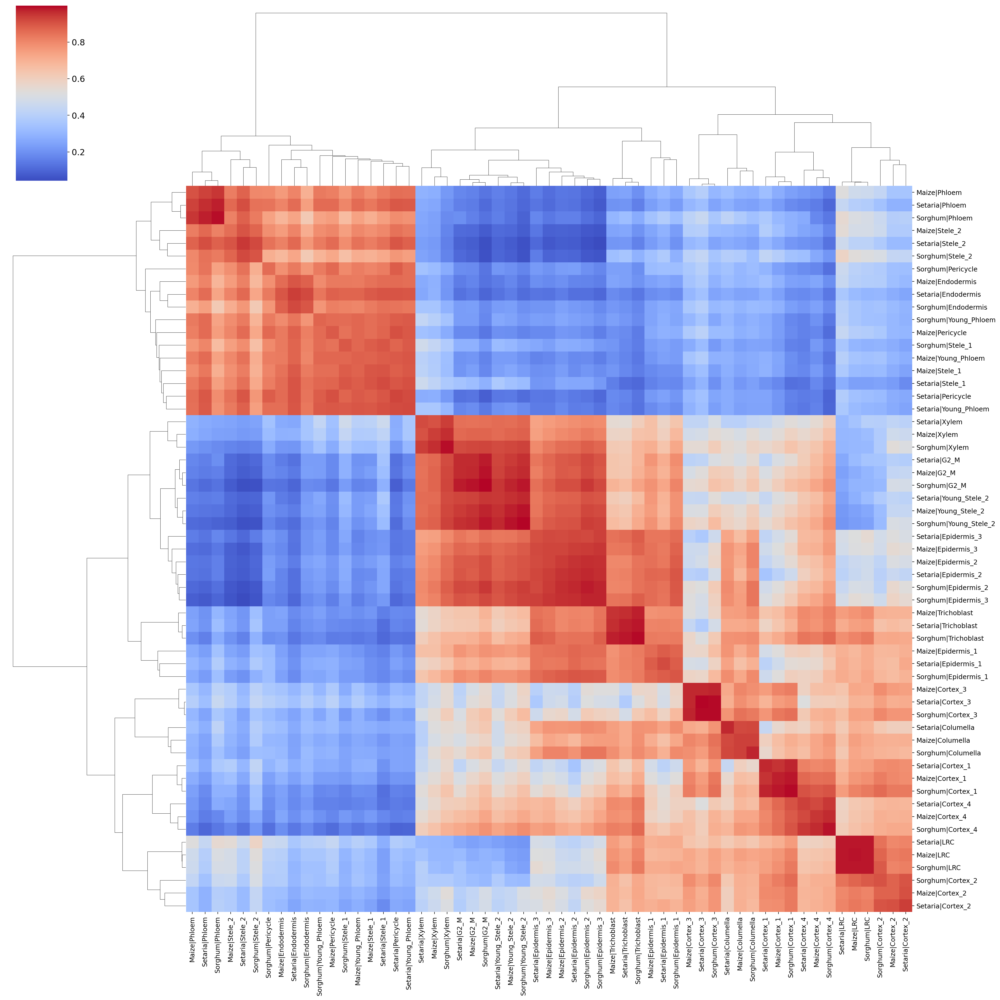

In [15]:
g = pymn.plotMetaNeighborUS(corrected_adata,figsize = (24,24),fontsize = 11,show = False,cbar_pos = (0.02,0.82,0.05,0.17), cmap = 'coolwarm')

In [4]:
import scgen
scgen.SCGEN.setup_anndata(nuclei_only_data, batch_key="Batch", labels_key="Cell Cluster Annotation")

model2 = scgen.SCGEN(nuclei_only_data, n_layers = 5,)
model2.train(
    max_epochs=150,
    batch_size=32,
    early_stopping=True,
    early_stopping_patience=7,
)

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 9/150:   6%|▌         | 9/150 [15:45<4:06:57, 105.09s/it, loss=4.02e+03, v_num=1]
Monitored metric elbo_validation did not improve in the last 7 records. Best score: 8262.407. Signaling Trainer to stop.


In [5]:
corrected_adata_nucl = model2.batch_removal()
corrected_adata_nucl

/home/passala/miniconda3/envs/Single_cell_data_fix/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


AnnData object with n_obs × n_vars = 29068 × 29539
    obs: 'Cell Cluster Annotation', 'Batch', 'Species', 'Cluster and Type', 'Cluster and Species', 'Type', 'Type and Species', 'n_genes_by_counts', 'total_counts', 'leiden', '_scvi_batch', '_scvi_labels'
    uns: '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'latent', 'corrected_latent'

In [ ]:
#corrected_adata_nucl.write('/data/passala/Generated_Tables/Temp_junk/corrected_nucl_only_norm_data_from_bruno.h5ad')

In [ ]:
#corrected_adata_nucl = sc.read_h5ad('/data/passala/Generated_Tables/Temp_junk/corrected_nucl_only_norm_data_from_bruno.h5ad')

In [6]:
sc.pp.neighbors(corrected_adata_nucl)
sc.tl.umap(corrected_adata_nucl)
sc.set_figure_params(figsize = (15,15),facecolor = 'white')

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:18)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:32)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:20)


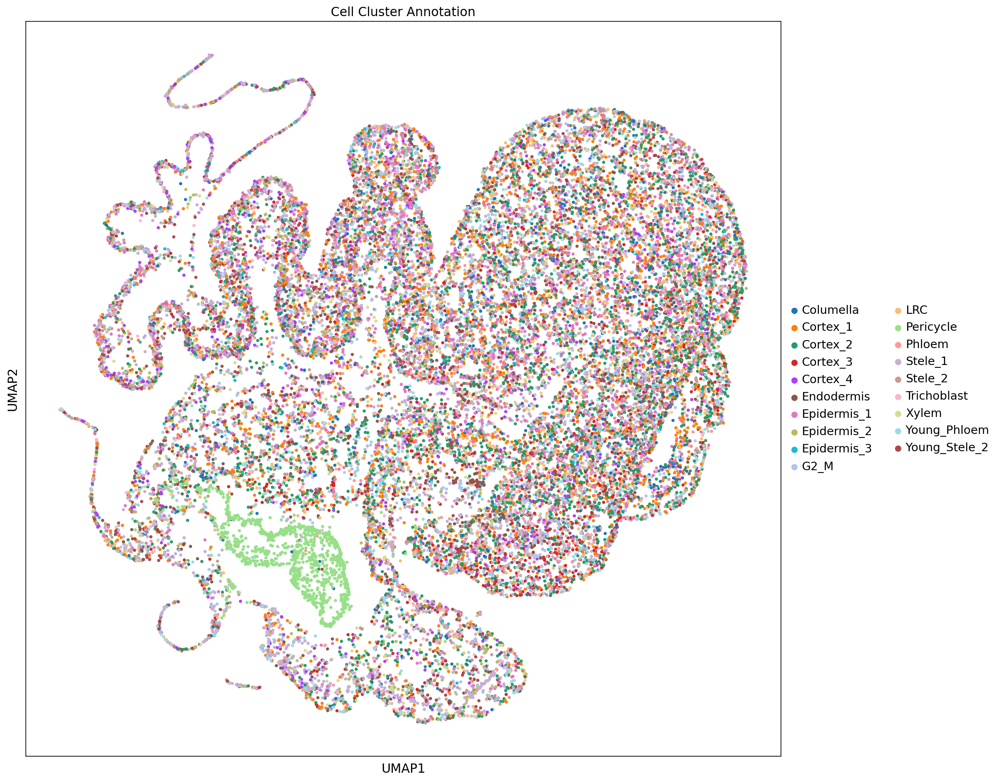

In [9]:
sc.pl.umap(corrected_adata_nucl, color=['Cell Cluster Annotation'], s = 50)

In [ ]:
sc.pl.umap(corrected_adata_nucl, color=['Batch'], s = 50)

In [ ]:
sc.pl.umap(corrected_adata_nucl, color=['Species'], s = 50)

In [ ]:
sc.pp.neighbors(corrected_adata_nucl, use_rep="corrected_latent")
sc.tl.umap(corrected_adata_nucl)


In [ ]:
sc.pl.umap(corrected_adata_nucl, color=['Cell Cluster Annotation'], s = 50)

In [ ]:
sc.pl.umap(corrected_adata_nucl, color=['Batch'], s = 50)

In [ ]:
# pymn.variableGenes(corrected_adata,study_col = 'Species')
# pymn.MetaNeighborUS(corrected_adata,study_col = 'Species',ct_col = 'Cell Cluster Annotation', compute_p= True)
# g = pymn.plotMetaNeighborUS(corrected_adata,figsize = (20,20),fontsize = 15,show = False,cbar_pos = (0.02,0.82,0.05,0.17), cmap = 'coolwarm')
# g.savefig('/data/passala/Plots_for_projects/Bruno_Ken_cross_species_single_cell/different_integration_method_metaneighbor_redo.svg')

In [ ]:
corrected_adata

In [ ]:
sc.pp.neighbors(corrected_adata, use_rep="corrected_latent")
sc.tl.umap(corrected_adata)
sc.pl.umap(corrected_adata, color=['Species', 'Cell Cluster Annotation'])

In [ ]:
sc.pl.umap(corrected_adata, color=['Species'], s = 12)

In [ ]:
sc.pl.umap(corrected_adata, color=['Batch'], s = 12)

In [ ]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
matplotlib.rcParams['svg.fonttype'] = 42

In [ ]:
sc.settings.figdir = '/data/passala/Plots_for_projects/Coexpressolog_paper_plots'

In [ ]:
sc.pl.umap(corrected_adata, color=['Cell Cluster Annotation'], s = 12)